In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import scipy as sp
from scipy import io
import scipy.ndimage as ndimage
import skimage
from skimage import measure
import skimage.morphology as morphology


In [2]:
data = sp.io.loadmat('data/2013_DFC_contest.mat')

In [3]:
lidar = data['lidar']
hsi = data['hyper']


In [4]:
def rgbify(image, rgb_bands = (54, 32, 18)):
    hsi_rgb = image[:,:,rgb_bands]
    hsi_rgb = hsi_rgb/hsi_rgb.max() # normalisation des valeurs dans [0,1] pour l'affichage

    pmin,pmax = np.percentile(hsi_rgb,(1,95),axis=(0,1))
    pminc,pmaxc = np.percentile(hsi_rgb,(1,90),axis=(0,1))
    hsi_rgb_pimped = hsi_rgb.copy()
    for i in range(pmin.size):
        hsi_rgb_pimped[:,:,i] = (hsi_rgb[:,:,i]-pmin[i])/(pmax[i]-pmin[i])
    hsi_rgb_pimped[hsi_rgb_pimped<0] = 0
    hsi_rgb_pimped[hsi_rgb_pimped>1] = 1
           
    return (hsi_rgb, hsi_rgb_pimped)

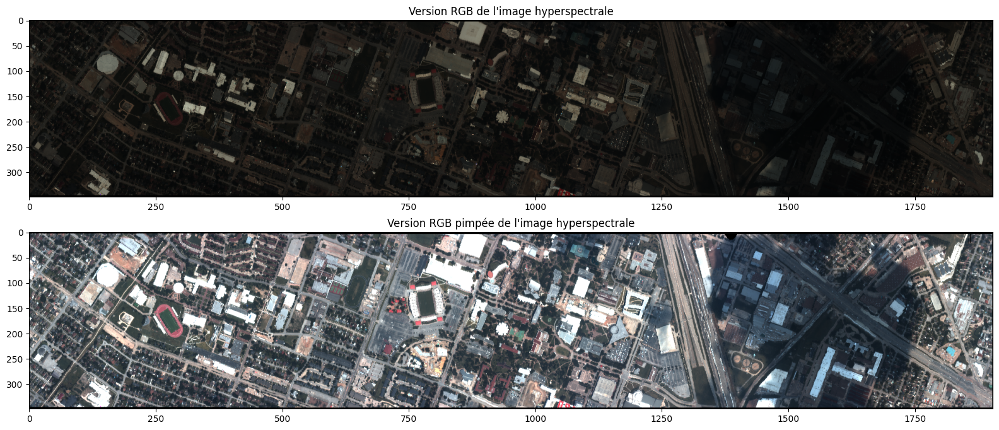

In [5]:
hsi_rgb, hsi_rgb_pimped = rgbify(hsi)
plt.figure(figsize=(20,8))
plt.subplot(211)
plt.title("Version RGB de l'image hyperspectrale")
plt.imshow(hsi_rgb)
plt.subplot(212)
plt.title("Version RGB pimpée de l'image hyperspectrale")
plt.imshow(hsi_rgb_pimped)
plt.show()

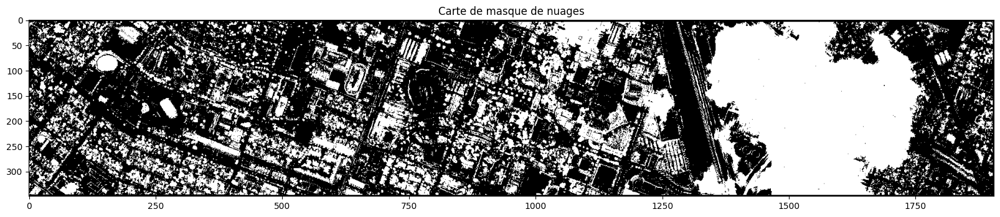

In [6]:
# Sélectionner les longueurs d'onde pour le calcul du ratio spectral
wl1 = 440  # Longueur d'onde pour la bande bleue
wl2 = 870  # Longueur d'onde pour la bande infrarouge

# Calculer les longueurs d'onde de l'image hyperspectrale
wavelengths = np.linspace(380, 1050, hsi.shape[2])

# Extraire les bandes de longueurs d'onde sélectionnées
band1 = hsi[:, :, 18]
band2 = hsi[:, :, 70]
band2 = band2 + 0.01
# Calculer le ratio spectral
ratio = np.divide(band1, band2)

# Seuiller le ratio spectral pour détecter les nuages (threshold optimal)
threshold = 1.11
cloud_mask = np.where(ratio > threshold, 1, 0)

cloud_mask_cp = cloud_mask.copy()
# Afficher le deuxième subplot en grand
fig, ax = plt.subplots(figsize=(20,8))
ax.imshow(cloud_mask, cmap='gray')
ax.set_title('Carte de masque de nuages')

plt.show()

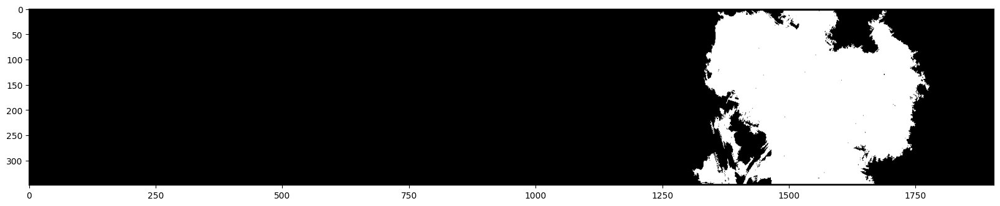

In [7]:
# Identifier les différentes régions connectées dans le masque de nuages
labelled_mask = measure.label(cloud_mask_cp)

# Récupérer les propriétés de chaque région
props = measure.regionprops(labelled_mask)

# Trouver l'indice de la région la plus grande
max_area = 0
max_index = 0
for i, region in enumerate(props):
    if region.area > max_area:
        max_area = region.area
        max_index = i

# Créer un masque pour la région la plus grande
largest_region_mask = np.zeros_like(cloud_mask)
largest_region_mask[labelled_mask == max_index + 1] = 1

# Visualisation des résultats
fig, ax = plt.subplots(figsize=(20,8))
ax.imshow(largest_region_mask, cmap='gray')
#ax.title('Carte de masque de nuages avec la plus grande région')

plt.show()

Text(0.5, 1.0, 'Masque avec les trous supprimés')

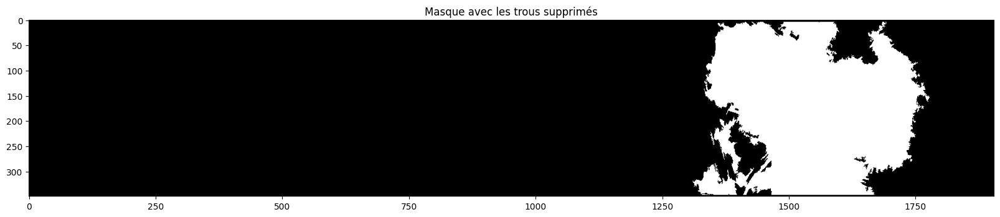

In [8]:

# seuil de taille de trou à conserver
min_hole_size = 14

# création du masque binaire de la région à remplir les trous
mask = largest_region_mask.astype(bool)

# remplissage des trous de grande taille
filled_mask = ndimage.binary_fill_holes(mask)

# suppression des trous de petite taille
hole_mask = filled_mask ^ mask  # masque des trous
filtered_holes = morphology.remove_small_objects(hole_mask, min_size=min_hole_size)
largest_region_mask = filled_mask ^ filtered_holes  # masque final

# affichage de l'image avec les trous supprimés
fig, ax = plt.subplots(figsize=(20, 10))
ax.imshow(largest_region_mask, cmap='gray')
ax.set_title('Masque avec les trous supprimés')

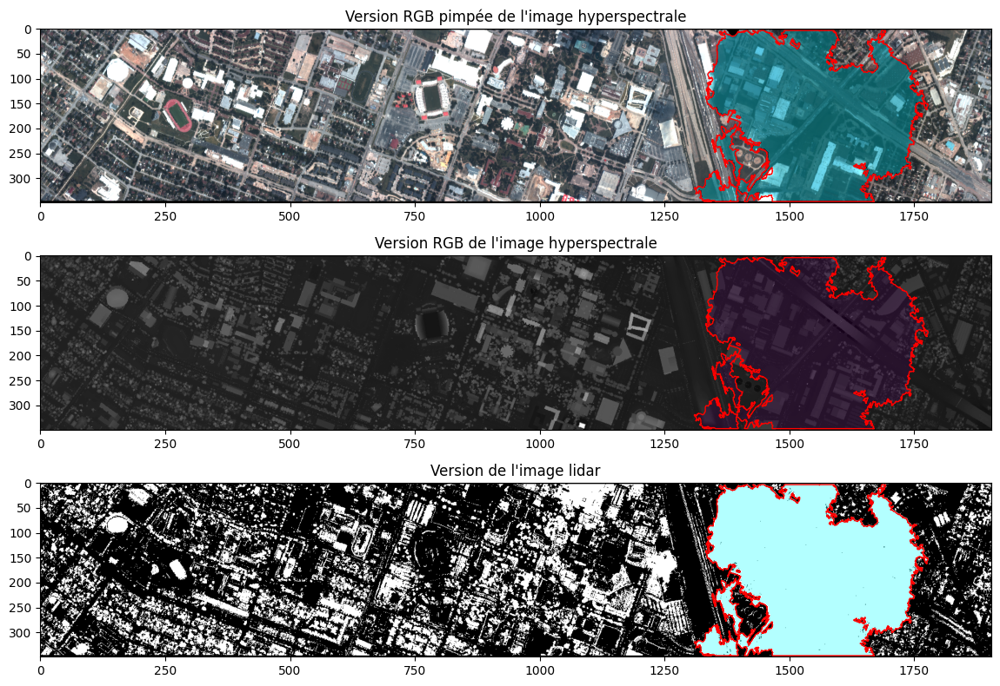

In [9]:
contours = measure.find_contours(largest_region_mask, 0.5)

fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(20, 8))

# Première ligne : image hyperspectrale avec masque
axes[0].imshow(hsi_rgb_pimped, cmap='gray')
axes[0].imshow(np.ma.masked_where(largest_region_mask == 0, largest_region_mask), cmap='cool', alpha=0.3)
for contour in contours:
    axes[0].plot(contour[:, 1], contour[:, 0], linewidth=1, color='red')
axes[0].set_title('Version RGB pimpée de l\'image hyperspectrale')

# Deuxième ligne : image hyperspectrale sans masque
axes[1].imshow(lidar, cmap='gray')
axes[1].set_title('Version RGB de l\'image hyperspectrale')
axes[1].imshow(np.ma.masked_where(largest_region_mask == 0, largest_region_mask), alpha=0.3)
for contour in contours:
    axes[1].plot(contour[:, 1], contour[:, 0], linewidth=1, color='red')

# Troisième ligne : image lidar
axes[2].set_title('Version de l\'image lidar')
axes[2].imshow(cloud_mask_cp, cmap='gray')
axes[2].imshow(np.ma.masked_where(largest_region_mask == 0, largest_region_mask), cmap='cool', alpha=0.3)
for contour in contours:
    axes[2].plot(contour[:, 1], contour[:, 0], linewidth=1, color='red')
plt.tight_layout()
plt.show()

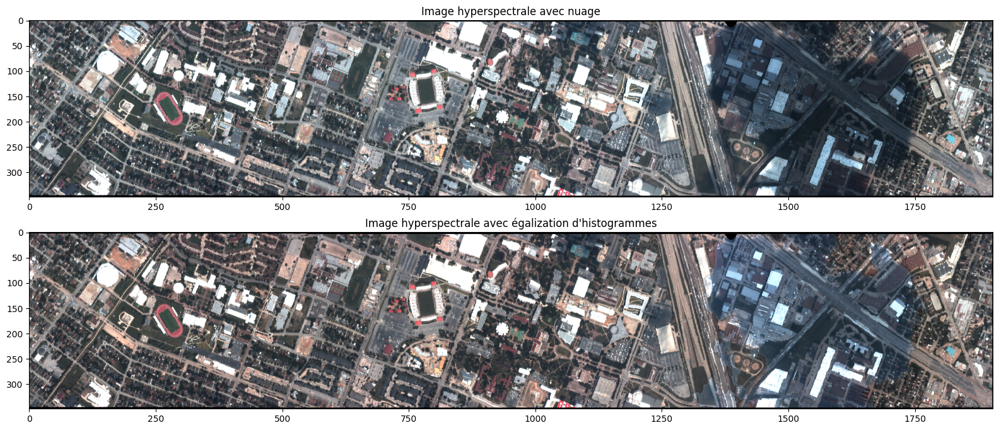

In [10]:
# Réhaussement de la luminosité dans la zone du nuage
reinforced_hsi_cloud = hsi.copy()
reinforced_hsi_cloud[largest_region_mask] = reinforced_hsi_cloud[largest_region_mask] * 1.8  # Réhaussement de la luminosité
# Conversion de l'image en RGB
_, hsi_rgb_reinforced = rgbify(reinforced_hsi_cloud.astype('float64'))
_, hsi_rgb = rgbify(hsi)
# Affichage de l'image résultante
plt.figure(figsize=(20,8))
plt.subplot(211)
plt.title("Image hyperspectrale avec nuage")
plt.imshow(hsi_rgb_pimped)
plt.subplot(212)
plt.title("Image hyperspectrale avec égalization d'histogrammes")
plt.imshow(hsi_rgb_reinforced)
plt.show()

In [11]:
hsi_cloud_reduction = reinforced_hsi_cloud.copy()
print(hsi_cloud_reduction.shape)
cloud_pos = np.where(filled_mask)
no_cloud_pos = np.where(~filled_mask)
for i in range(144):
    pic = reinforced_hsi_cloud[:,:,i]
    
    cloud_img = pic[cloud_pos]
    nocloud_img = pic[no_cloud_pos]
    pic[cloud_pos] = skimage.exposure.match_histograms(cloud_img, nocloud_img)
    #pic[:] = skimage.exposure.equalize_hist(pic[:])

(349, 1905, 144)


In [12]:
reinforced_hsi_cloud2 = hsi.copy()
cloud_pos = np.where(filled_mask)
no_cloud_pos = np.where(~filled_mask)
for i in range(144):
    pic = reinforced_hsi_cloud2[:,:,i]
    
    cloud_img = pic[cloud_pos]
    nocloud_img = pic[no_cloud_pos]
    pic[cloud_pos] = skimage.exposure.match_histograms(cloud_img, nocloud_img)

Il y a au moins un False dans la liste


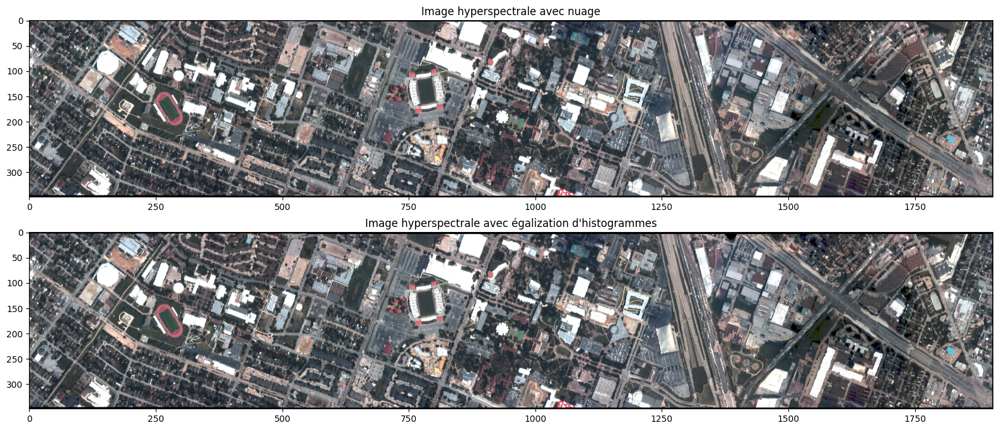

In [13]:
_, hsi_rgb_nocloud = rgbify(reinforced_hsi_cloud)
_, hsi_rgb_nocloud2 = rgbify(reinforced_hsi_cloud2)


test = hsi_rgb_nocloud == hsi_rgb_nocloud2
if test.any():
    print("Il y a au moins un False dans la liste")
else:
    print("La liste ne contient que des True")
plt.figure(figsize=(20,8))
plt.subplot(211)
plt.title("Image hyperspectrale avec nuage")
plt.imshow(hsi_rgb_nocloud2)
plt.subplot(212)
plt.title("Image hyperspectrale avec égalization d'histogrammes")
plt.imshow(hsi_rgb_nocloud)
plt.show()

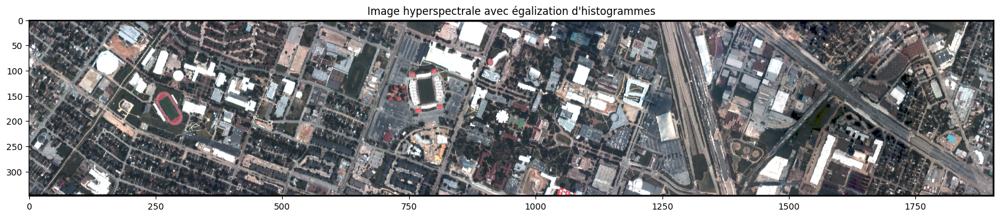

In [14]:
_, hsi_rgb_nocloud2 = rgbify(reinforced_hsi_cloud2)


plt.figure(figsize=(20,8))
plt.title("Image hyperspectrale avec égalization d'histogrammes")
plt.imshow(hsi_rgb_nocloud2)
plt.show()

In [15]:
hsi_cloud_reduction.shape

(349, 1905, 144)

Text(0.5, 1.0, 'Image égalisée et lissée')

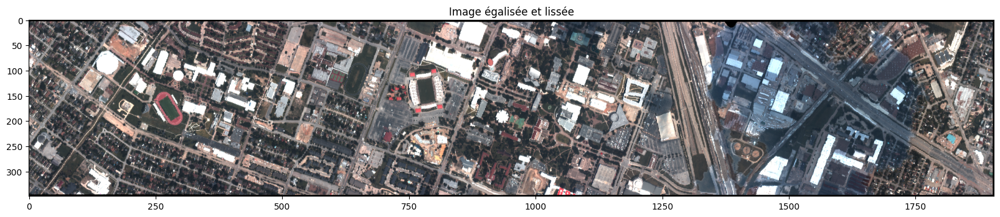

In [16]:
from skimage.filters import gaussian


# Masque du contour du nuage
contour_mask = skimage.segmentation.find_boundaries(filled_mask)

# Appliquer un filtre gaussien sur le contour du nuage
hsi_cloud_reduction_smoothed = hsi_cloud_reduction.copy()
for i in range(144):
    pic = hsi_cloud_reduction[:,:,i]
    
    # Extraire les pixels du contour
    contour_pixels = pic[contour_mask]
    
    # Appliquer le filtre gaussien sur les pixels du contour
    contour_pixels_smoothed = gaussian(contour_pixels, sigma=1, preserve_range=True)
    
    # Remplacer les pixels du contour par les pixels filtrés
    pic[contour_mask] = contour_pixels_smoothed
    
# Convertir l'image en RGB
_, hsi_rgb_nocloud2 = rgbify(hsi_cloud_reduction)
# Afficher l'image résultante
fig, ax = plt.subplots(figsize=(20, 10))
ax.imshow(hsi_rgb_nocloud2)
ax.set_title('Image égalisée et lissée')

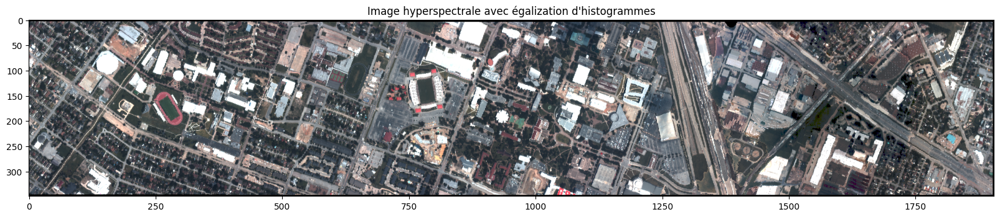

In [17]:
plt.figure(figsize=(20,8))
plt.title("Image hyperspectrale avec égalization d'histogrammes")
plt.imshow(hsi_rgb_nocloud)
plt.show()